# <a id=top><center><font size=6.7>🗓 M5 Forecasting - Accuracy 📆</font></center></a>

## <div class="pull-right">2017025769 신선웅 🙋🏻‍♂️<br>2018005478 신민경 🙋</div><br>
## <div class="pull-right">🙋🏻‍♂️🙋I swear this notebook didn't fork others</div>

# <font size=6>Introduction</font><br>
## Estimate the unit sales of Walmart retail goods 🛒

<img src='https://raw.githubusercontent.com/SunwoongShin/storage/master/project/kaggle/m5/src/figure1.png' style='float:left; width:900px;'>

**The objective of the M5 forecasting competition is to advance the theory and practice of forecasting by identifying the method(s) that provide the most accurate point forecasts for each of the 42,840 time series of the competition.<br>
M5 예측 대회 목표는 42,840개의 시계열 데이터 각각에 대해 정확히 예측하는 것입니다.**

# <font size=6>Content</font><br>
<font size=3>
    
**[1. The Datasets](#1)**

  * [1.1. Calendar.csv](#1-1)
  * [1.2. Sell_prics.csv](#1-2)
  * [1.3. Sales_train_validaiton.csv](#1-3)
  * [1.4. Sales_train_evaluaton.csv](#1-4)
  * [1.5. Submission.csv](#1-5)
  * [1.6. Data Memory Reducing](#1-6)

**[2. Exploratory Data Analysis](#2)**

  * [2.1 NaN Check](#2-1)
  * [2.2 Special Days](#2-2)
      * [2.2.1 Event Days](#2-2-1)
      * [2.2.2 Snap Days](#2-2-2)
  * [2.3. Sales Analysis](#2-3)
      * [2.3.1 Calendar Plot](#2-3-1)
      * [2.3.2 Category Plot](#2-3-2)
      * [2.3.3 Sales Plot](#2-3-3)
  * [2.4. Sample Data](#2-4)    
    
**[3. Simple Modeling](#3)**

  * [3.1 Train/Val Split](#3-1)
  * [3.2 Simple Moving Average](#3-2)
  * [3.3 Simple Exponential Smoothing](#3-3)
  * [3.4 Double Exponential Smoothing](#3-4)
  * [3.5 Holt Linear](#3-5)  
  * [3.6 ARIMA](#3-6)
  * [3.7 Model Evaluation](#3-7) </font>

### 📚Basic Libraries & Initial Setting

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 9, 'display.max_columns', 30)
import datetime
from tqdm.auto import tqdm
import warnings

### 📚Libraries for Visualization & EDA

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()

import missingno

import pyecharts
pyecharts.online()
from pyecharts import Line, Bar, Pie, Overlap, Gauge
from IPython.display import display, Image

import bokeh
from bokeh.io import show
from bokeh.palettes import Spectral9
from bokeh.plotting import figure, show, output_notebook, reset_output
output_notebook()

import altair as alt

import calplot

import colorcet as cc
rgb_light_palette = [(0, 122, 255), # Blue
    (255, 149, 0), # Orange
    (52, 199, 89), # Green
    (255, 59, 48), # Red
    (175, 82, 222),# Purple
    (255, 45, 85), # Pink
    (88, 86, 214), # Indigo
    (90, 200, 250),# Teal
    (255, 204, 0)  # Yellow
]
light_palette = np.array(rgb_light_palette)/255

Loading BokehJS ...

### 📚Libraries for Modeling

In [3]:
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from fbprophet import Prophet

# <a id='1'><font size=6>1. The datasets</font></a>

The M5 dataset, generously made available by Walmart, involves the unit sales of various products sold in the USA, organized in the form of grouped time series. More specifically, the dataset involves the unit sales of 3,049 products, classified in 3 product categories (Hobbies, Foods, and Household) and 7 product departments, in which the above-mentioned categories are disaggregated. The products are sold across ten stores, located in three States (CA, TX, and WI).<br>
월마트가 제공하는 M5 데이터 세트에는 미국에서 판매되는 다양한 제품의 단위 판매가 포함되어 있으며, 이는 그룹화된 시계열 형태로 구성되어 있습니다. 좀 더 구체적으로, 데이터 세트는 3개의 제품 카테고리(취미, 식품 및 가정)와 7개의 제품 부서로 분류된 3,049개 제품의 단위 판매를 포함하며, 상기 범주가 세분화됩니다. 이 제품은 3개 주(CA, TX, WI)에 위치한 10개 매장에서 판매됩니다.

- `calendar.csv` - Contains the dates on which products are sold. The dates are in a `yyyy/dd/mm` format.
- `sell_prices.csv` - Contains information about the price of the products sold per store and date.
- `sales_train_validation.csv` - Contains the historical daily unit sales data per product and store `[d_1 - d_1913]`.
- `sales_train_evaluation.csv` - Available one month before the competition deadline. It will include sales for `[d_1 - d_1941]`.
- `submission.csv` - Demonstrates the correct format for submission to the competition.

<img src='https://raw.githubusercontent.com/SunwoongShin/storage/master/project/kaggle/m5/src/figure2.png' style='float:left; width:900px;'>

# <a id=1-1>1.1 calendar.csv</a>
Contains information about the price of the products sold per store and date.<br>제품이 판매 되는 날짜에 대한 정보가 포함되어 있습니다.
- date - The date in a “y-m-d” format. “y-m-d” 형식의 날짜.
- wm_yr_wk - The id of the week the date belongs to. 해당 날짜가 속한 주(week)의 ID.
- weekday - The type of the day (Saturday, Sunday, ..., Friday). 날짜의 타입(토요일, 일요일, ..., 금요일).
- wday - The id of the weekday, starting from Saturday. 요일의 ID, 토요일 부터 시작.
- month - The month of the date. 해당 날짜의 달(month).
- year - The year of the date. 해당 날짜의 년도(year).
- event_name_1 - If the date includes an event, the name of this event. 해당 날짜에 이벤트가 포함되어 있을 경우, 이벤트의 이름.
- event_type_1 - If the date includes an event, the type of this event. 해당 날짜에 이벤트가 포함되어 있을 경우, 이벤트의 타입.
- event_name_2 - If the date includes a second event, the name of this event. 해당 날짜에 두번째 이벤트가 포함되어 있을 경우, 이벤트의 이름.
- event_type_2 - If the date includes a second event, the type of this evenr. 해당 날짜에 두번째 이벤트가 포함되어 있을 경우, 이벤트의 타입
- snap_CA, snap_TX, and snap_WI - A binary variable (0 or 1) indicating whether the stores of CA, TX or WI allow SNAP purchases on the examined date. 해당 날짜에 CA, TX 또는 WI의 스토어가 SNAP 구매를 허용하는지 여부를 나타내는 이진 변수(0 또는 1).

In [4]:
calendar = pd.read_csv('./data/calendar.csv')
calendar

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0
1968,2016-06-19,11621,Sunday,2,6,2016,d_1969,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0


# <a id=1-2>1.2 sell_prices.csv</a>
Contains information about the price of the products sold per store and date. 매장 및 날짜별로 판매되는 제품의 가격에 대한 정보가 포함되어 있습니다.
- store_id - The id of the store where the product is sold. 제품이 판매되는 매장의 ID.
- item_id - The id of the product. 제품의 ID.
- wm_yr_wk - The id of the week. 해당 주(week)의 ID.
- sell_price - The price of the product for the given week/store. The price is provided per week (average across seven days). If not available, this means that the product was not sold during the examined week. Note that although prices are constant at weekly basis, they may change through time (both training and test set). 지정된 주(week)/매장의 제품 가격. 가격은 주(week) 별로 제공됩니다(일주일의 평균). 사용할 수 없는 경우 이는 해당 제품이 검사된 주 중에 판매되지 않았음을 의미합니다 (주 단위로 가격이 일정하지만 시간이 지남에 따라 변할 수 있다는 점에 유의).

In [5]:
sell_prices = pd.read_csv('./data/sell_prices.csv')
sell_prices

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
...,...,...,...,...
6841117,WI_3,FOODS_3_827,11618,1.00
6841118,WI_3,FOODS_3_827,11619,1.00
6841119,WI_3,FOODS_3_827,11620,1.00
6841120,WI_3,FOODS_3_827,11621,1.00


# <a id=1-3>1.3 sales_train_validation.csv</a>
Contains the historical daily unit sales data per product and store.<br> 제품과 매장에 따른 과거 일일 판매 데이터가 포함되어 있습니다.
- item_id - The id of the product. 제품의 ID.
- dept_id - The id of the department the product belongs to. 제품이 속한 부서의 ID(cat_id의 하위 카테고리).
- cat_id - The id of the category the product belongs to. 제품이 속한 카테고리의 ID.
- store_id - The id of the store where the product is sold. 제품이 판매되는 매장의 ID.
- state_id - The State where the store is located. 매장이 속해있는 주(state)
- d_1, d_2, …, d_i, … d_1913 - The number of units sold at day i, starting from 2011-01-29. i일에 판매된 단위 수. (2011-01-29일부터 시작)

In [6]:
sales_train_validation = pd.read_csv('./data/sales_train_validation.csv')
sales_train_validation

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,...,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,2,0,0,0,1,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,0,0,0,1,2,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,4,2,0,3,0,1,0,5,4,1,0,1,3,7,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,5,0,1,1,...,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,2,4,1,8,5,...,2,4,0,0,0,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,0,0,0,0,...,2,0,1,0,3,0,0,1,0,0,1,0,3,1,3
30489,FOODS_3_827_WI_3_validation,FOODS_3_827,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# <a id=1-4>1.4 sales_train_evaluation.csv</a>
Contains the historical daily unit sales data per product and store. <br>제품과 매장에 따른 과거 일일 판매 데이터가 포함되어 있음. 
- item_id - 제품의 ID.
- dept_id - 제품이 속한 부서의 ID (cat_id의 하위 카테고리).
- cat_id - 제품이 속한 카테고리의 ID.
- store_id - 제품이 판매되는 매장의 ID
- state_id - 매장이 속해있는 주(state)
- d_1, d_2, …, d_i, … d_1941 - The number of units sold at day i, starting from 2011-01-29. i일에 판매된 단위 수(2011-01-29일부터 시작).
> 📌 A month ago to the end of a competition, the value of validation is provided. I guess Walmart uploaded `sales_train_evaluation.csv` a month before the competition ends. <br> 경기가 종료되기 한 달 전에 validation행의 값들이 제공되었습니다. 이로 미루어 볼 때 sales_train_validation.csv은 처음부터 공개되었고, 경기종료 한 달 전부터 sales_train_evaluation.csv를 공개했을것으로 추측됩니다.

In [7]:
sales_train_evaluation = pd.read_csv('./data/sales_train_evaluation.csv')
sales_train_evaluation

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,...,d_1927,d_1928,d_1929,d_1930,d_1931,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,1,2,2,1,0,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,3,0,0,1,0,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,...,4,2,1,1,1,1,1,0,4,0,1,3,0,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30486,FOODS_3_824_WI_3_evaluation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,5,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
30487,FOODS_3_825_WI_3_evaluation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,2,4,1,8,5,...,1,0,3,3,1,0,0,1,2,0,1,0,1,0,2
30488,FOODS_3_826_WI_3_evaluation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,0,0,0,0,...,1,1,0,2,1,1,1,1,4,6,0,1,1,1,0
30489,FOODS_3_827_WI_3_evaluation,FOODS_3_827,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,1,2,0,5,4,0,2,2,5,1


# <a id=1-5>1.5 sample_submission.csv</a>
- Predict F1-F28. 각 행에 대해 판매되는 품목의 예측일수 28일(F1-F28)을 예측
- validation행의 경우 d_1914 - d_1941에 해당, evaluation(test)행의 경우 d_1942 - d_1969에 해당

In [8]:
sample_submission = pd.read_csv('./data/sample_submission.csv')
sample_submission

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15,F16,F17,F18,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60976,FOODS_3_824_WI_3_evaluation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
60977,FOODS_3_825_WI_3_evaluation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
60978,FOODS_3_826_WI_3_evaluation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
60979,FOODS_3_827_WI_3_evaluation,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In this competition, I need to forecast the sales for [d_1942 - d_1969]. These rows form the evaluation set. The rows [d_1914 - d_1941] form the validation set, and the remaining rows form the training set. Now, since I understand the dataset and know what to predict, let us visualize the dataset.<br>
이 대회에서는 [d_1942 - d_1969]의 매출을 예측해야 합니다. 이제 무엇을 예측해야 할지 알고 있으므로 데이터 세트를 시각화해 보겠습니다.

# <a id=1-6>1.6 Data Memory Reducing</a>

By changing the type to use fewer bytes through the astype() of numpy, I can save memory. The less bytes I use, the less range I can express, so I reduced the memory by checking the minimum and maximum values of the data I are dealing with.<br>numpy의 astype()을 통해 더 적은 바이트를 사용하도록 Type을 변경함으로써 메모리를 절약했습니다. 더 적은 바이트를 사용할수록 표현할 수 있는 수의 범위가 줄어들게 되므로 다루는 데이터의 최소값, 최대값을 체크해가며 메모리를 줄여나갔습니다.

In [9]:
for dtype in ['int8', 'int16', 'int32', 'int64']:
    print(np.iinfo(dtype))

Machine parameters for int8
---------------------------------------------------------------
min = -128
max = 127
---------------------------------------------------------------

Machine parameters for int16
---------------------------------------------------------------
min = -32768
max = 32767
---------------------------------------------------------------

Machine parameters for int32
---------------------------------------------------------------
min = -2147483648
max = 2147483647
---------------------------------------------------------------

Machine parameters for int64
---------------------------------------------------------------
min = -9223372036854775808
max = 9223372036854775807
---------------------------------------------------------------



In [10]:
for dtype in ['float16', 'float32', 'float64']:
    print(np.finfo(dtype))

Machine parameters for float16
---------------------------------------------------------------
precision =   3   resolution = 1.00040e-03
machep =    -10   eps =        9.76562e-04
negep =     -11   epsneg =     4.88281e-04
minexp =    -14   tiny =       6.10352e-05
maxexp =     16   max =        6.55040e+04
nexp =        5   min =        -max
---------------------------------------------------------------

Machine parameters for float32
---------------------------------------------------------------
precision =   6   resolution = 1.0000000e-06
machep =    -23   eps =        1.1920929e-07
negep =     -24   epsneg =     5.9604645e-08
minexp =   -126   tiny =       1.1754944e-38
maxexp =    128   max =        3.4028235e+38
nexp =        8   min =        -max
---------------------------------------------------------------

Machine parameters for float64
---------------------------------------------------------------
precision =  15   resolution = 1.0000000000000001e-15
machep =    -52   e

In [11]:
def reduce_mem_usage(data):
    numerics = ['int8', 'int16', 'int32', 'int64', 'float32', 'float64']
    start_memory = data.memory_usage().sum() / 1024**2    
    for col in data.columns:
        col_type = data[col].dtypes
        if col_type in numerics:
            c_min = data[col].min()
            c_max = data[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    data[col] = data[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    data[col] = data[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    data[col] = data[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    data[col] = data[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    data[col] = data[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    data[col] = data[col].astype(np.float32)
                else:
                    data[col] = data[col].astype(np.float64)    
    end_memory = data.memory_usage().sum() / 1024**2
    print('Memory optimization from {:5.2f}MB to {:5.2f}MB ({:.1f}% reduction)'
          .format(start_memory, end_memory, 100 * (start_memory - end_memory) / start_memory))
    return data

In [12]:
calendar = reduce_mem_usage(calendar)
sell_prices = reduce_mem_usage(sell_prices)
sales_train_validation = reduce_mem_usage(sales_train_validation)
sales_train_evaluation = reduce_mem_usage(sales_train_evaluation)

Memory optimization from  0.21MB to  0.12MB (41.9% reduction)
Memory optimization from 208.77MB to 130.48MB (37.5% reduction)
Memory optimization from 446.40MB to 95.00MB (78.7% reduction)
Memory optimization from 452.91MB to 96.13MB (78.8% reduction)


# <a id='2'><font size=6>2. Exploratory Data Analysis</font></a>

# <a id=2-1>2.1 NaN Check</a>
In three csv files, I can see there's no `NaN` just by using `isnull()`. But I can check that `calendar.csv` has plenty of `NaN`.<br> 세 개의 csv파일에는 `NaN`값이 전혀 없었습니다. 하지만 `calendar.csv` 에는 총 7542개의 `NaN`값이 검출되었습니다.

In [13]:
calendar_nan = calendar.isnull().sum().sum()
sell_prices_nan = sell_prices.isnull().sum().sum()
sales_train_validation_nan = sales_train_validation.isnull().sum().sum()
sales_train_evaluation_nan = sales_train_evaluation.isnull().sum().sum()
print('Missing value of calendar -', calendar_nan)
print('Missing value of sell_prices -', sell_prices_nan)
print('Missing value of sales_train_validation -', sales_train_validation_nan)
print('Missing value of sales_train_evaluation -', sales_train_evaluation_nan)

Missing value of calendar - 7542
Missing value of sell_prices - 0
Missing value of sales_train_validation - 0
Missing value of sales_train_evaluation - 0


I used data-dense display which lets you quickly visually pick out patterns in data completion.<br> 패턴을 시각적으로 빠르게 확일할 수 있는 missingno.matrix를 사용했습니다.

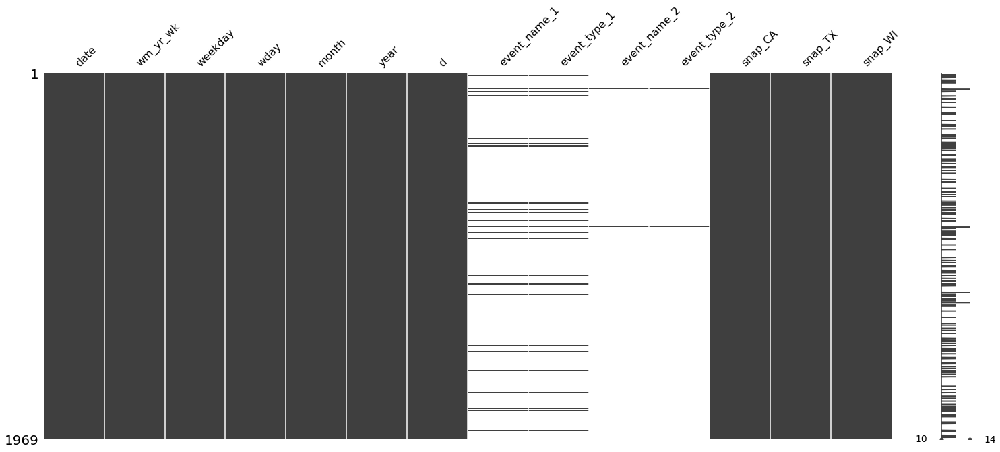

In [14]:
missingno.matrix(calendar);

And I simple visualized of nullity by column.
<br> 그리고 각 컬럼마다의 단순한 시각화(bar)를 해보았습니다.

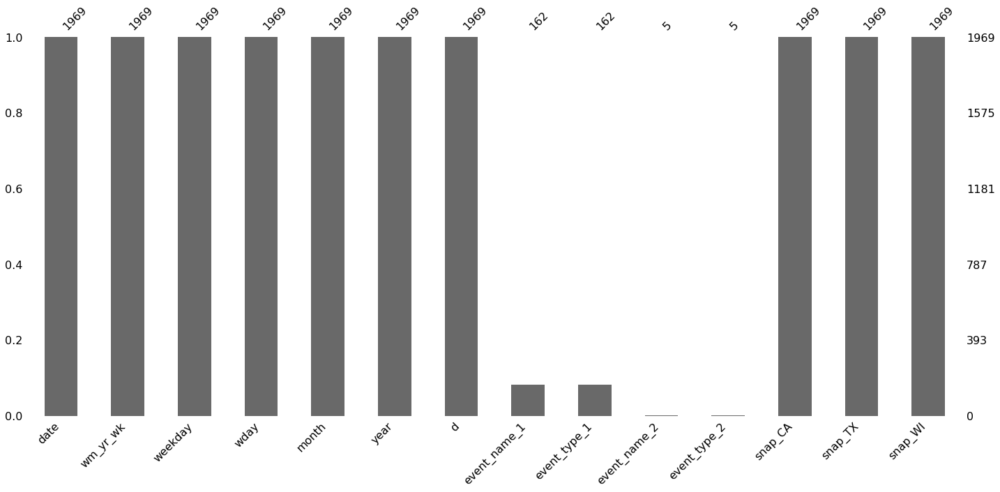

In [15]:
missingno.bar(calendar);

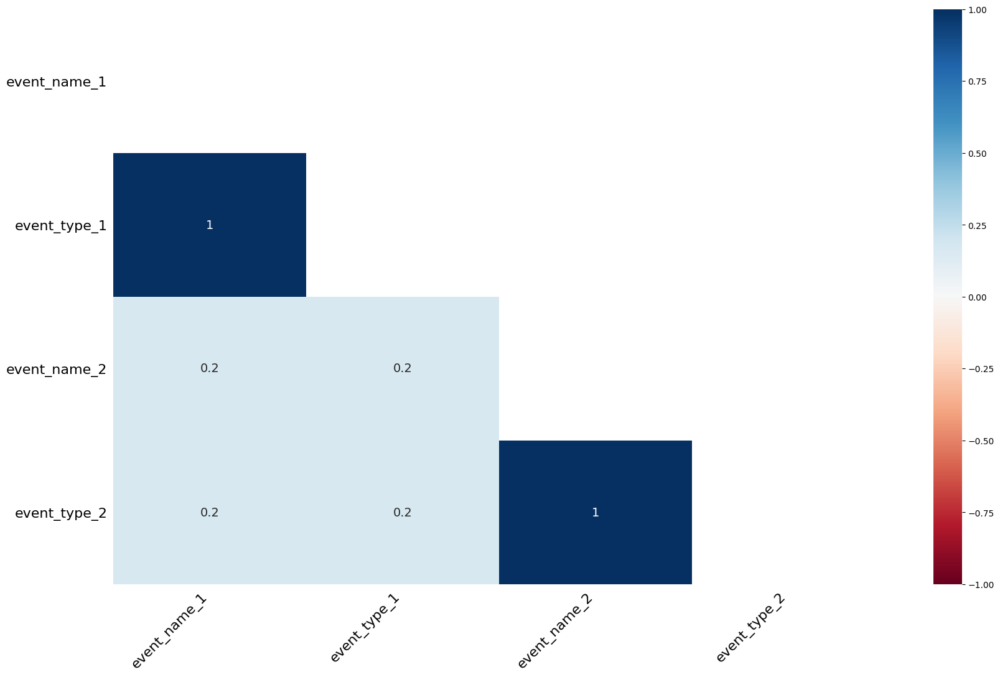

In [63]:
missingno.heatmap(calendar);

I checked the value of 'NaN' in total 4 columns 'event_name_1', 'event_type_1', 'event_name_2', and 'event_type_2'.<br>Now, let's see what events are in each column.<br>우리는 `event_name_1`, `event_type_1`, `event_name_2`, `event_type_2` 총 4개의 컬럼에서 `NaN`값을 눈으로 확인하였습니다.<br>이제 각 컬럼마다 어떤 event들이 있는지 직접 확인해보겠습니다.

# <a id=2-2>2.2 Special Days</a>

## (1) Event Days<a id=2-2-1></a>
I tried to print only rows containing 'event_name_2' and all the 'event_name_1' values were present. I could see that the second event names were written down to indicate when there were two events on one day.<br>
시각화 전에 `event_name_2`가 포함된 행들만 출력하여보았는데 모두 `event_name_1`값들이 존재하였습니다. 두 번째 이벤트 이름들은 한 날짜에 두 이벤트가 있을 때 표기하려고 적어둔 것임을 확인할 수 있었습니다.

In [16]:
calendar[calendar['event_name_2'].notna()]

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
85,2011-04-24,11113,Sunday,2,4,2011,d_86,OrthodoxEaster,Religious,Easter,Cultural,0,0,0
827,2013-05-05,11315,Sunday,2,5,2013,d_828,OrthodoxEaster,Religious,Cinco De Mayo,Cultural,1,1,1
1177,2014-04-20,11412,Sunday,2,4,2014,d_1178,Easter,Cultural,OrthodoxEaster,Religious,0,0,0
1233,2014-06-15,11420,Sunday,2,6,2014,d_1234,NBAFinalsEnd,Sporting,Father's day,Cultural,0,1,1
1968,2016-06-19,11621,Sunday,2,6,2016,d_1969,NBAFinalsEnd,Sporting,Father's day,Cultural,0,0,0


I looked at the number and type of each event at a glance through visualization.<br>In event_name_1', Dad's Day was made up of four, and I found out that it was pushed back to event_name_2 because of other important events (NBA Final).<br>
각 이벤트들의 수와 타입은 무엇인지 시각화를 통해 한눈에 알아보았습니다.<br>
`event_name_1`에서 아빠의 날이 하루 적은데, 다른 중요한 이벤트떄문에 (NBA결승전) `event_name_2`로 밀려난 것이기 때문입니다.

In [17]:
e_n_1 = pd.DataFrame(calendar['event_name_1'].value_counts())
e_n_1['number'] = e_n_1.index
e_n_1.columns = ['number', 'name']
alt.Chart(e_n_1).mark_bar().encode(y='name', x='number', color=alt.Color('name:N', legend=None)).properties(
    title='event_name_1', width=800, height=600)

alt.Chart(...)

The visualization of 'event_type_1' shows that there are relatively many religious days in the United States.<br>`event_type_1` 시각화를 통해 미국에서는 종교에 관련한 날이 비교적 많음을 알 수 있었습니다.

In [18]:
e_t_1 = calendar['event_type_1'].value_counts()
palette = [cc.rainbow[i] for i in [50, 100, 150, 200]]
event_figure = figure(x_range=list(map(str, e_t_1.index.values)), 
           plot_height=300, plot_width=800, title="event_type_1", 
           toolbar_location=None, tools="")

event_figure.vbar(x=list(map(str, e_t_1.index.values)),
       top=e_t_1.values, width=0.2, color=palette)

event_figure.xgrid.grid_line_color = None
event_figure.y_range.start = 0
show(event_figure)

In [19]:
e_n_2 = pd.DataFrame(calendar['event_name_2'].value_counts())
e_n_2['number'] = e_n_2.index
e_n_2.columns = ['number', 'name']
alt.Chart(e_n_2).mark_bar().encode(y='name', x='number', color=alt.Color('name:N', legend=None)).properties(
    title='event_name_2', width=800, height=80)

alt.Chart(...)

In [20]:
e_t_2 = calendar['event_type_2'].value_counts()
palette = [cc.rainbow[i] for i in [150, 50]]
event_figure = figure(x_range=list(map(str, e_t_2.index.values)), 
           plot_height=300, plot_width=500, title="event_type_2", 
           toolbar_location=None, 
           tools="")

event_figure.vbar(x=list(map(str, e_t_2.index.values)), top=e_t_2.values, width=0.2, color=palette)

event_figure.xgrid.grid_line_color = None
event_figure.y_range.start = 0
show(event_figure)

I analyzed the sales by event by averaging the total sales of all marts for each event. I compared the average sales of ordinary days.<br>
각 이벤트별 모든 마트들의 총 판매량 평균을 구하여 이벤트별 판매 추이를 분석해보았습니다. 이벤트가 없는 평범한 날의 판매 평균까지 비교하였습니다.

In [21]:
d_cols = [c for c in sales_train_validation.columns if 'd_' in c]
past_sales = sales_train_validation.set_index('id')[d_cols].T.merge(calendar.set_index('d')['date'],
                                                                    left_index=True, right_index=True, 
                                                                    validate='1:1').set_index('date')

In [22]:
past_sales_sum = pd.DataFrame(past_sales.sum(axis=1))
event_df = calendar[calendar['event_name_1'].notna()][['date', 'event_name_1']].set_index('date')
event_sales = pd.concat([past_sales_sum, event_df],axis=1)
event_sales = event_sales.fillna({'event_name_1':'NormalDay'})
event_sales = event_sales.dropna()
event_sales = event_sales.groupby(event_sales['event_name_1']).mean().sort_values(by=0, ascending=True)
event_sales_pie = pyecharts.Pie("Mean sales by Events", "Put your mouse on the graph", width=1000, height=750)
event_sales_pie.add("", list(event_sales.index), list(event_sales.iloc[:, 0]), center=[40,50], radius=[35,70], 
                     rosetype='radius', is_label_show=True, legend_orient='vertical', legend_pos='right')
event_sales_pie

## (2) Snap Days<a id=2-2-2></a>
For low income persons or family you can get assistance from government thru SNAP. Each month on one of the snap days you get a credit on a government issued debit card. It can be spent on food purchases only. The amount varies based on family size - 100 dollars to 300 dollars would be typical. Before 2017 the purchases had to be made in the store - more recently some pickup purchases could be paid for.<br>
저소득자나 가족의 경우 SNAP를 통해 정부로부터 지원을 받을 수 있습니다. 정부가 발행한 직불카드를 매달 사용할 수 있습니다. 이 카드는 오직 음식 구입에만 사용될 수 있습니다. 금액은 가족 크기에 따라 다릅니다. 100달러에서 300달러가 일반적입니다. 2017년 이전에는 매장에서 구매해야 했습니다. 더 최근에는 일부 픽업 구매에 대한 비용을 지불할 수 있었습니다.

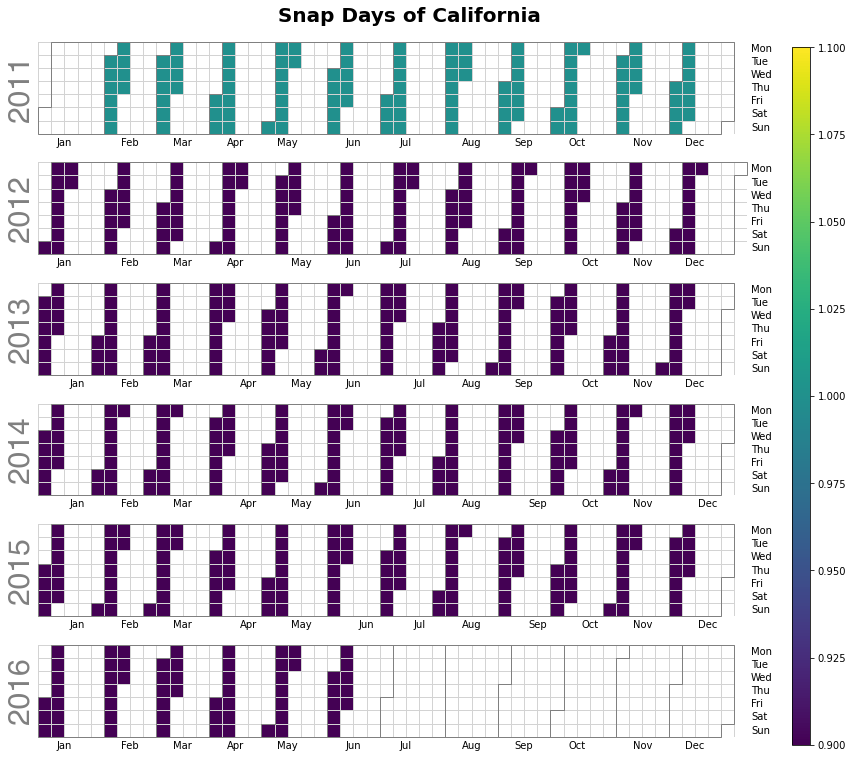

In [23]:
snap_df=calendar[['date','snap_CA', 'snap_TX', 'snap_WI']]
snap_CA=snap_df['snap_CA']; snap_CA.index=pd.to_datetime(snap_df['date'])
calplot.calplot(snap_CA, linecolor='lightgray', fillcolor='white', suptitle='Snap Days of California',
               suptitle_kws={'fontsize':20, 'fontweight':'bold'});

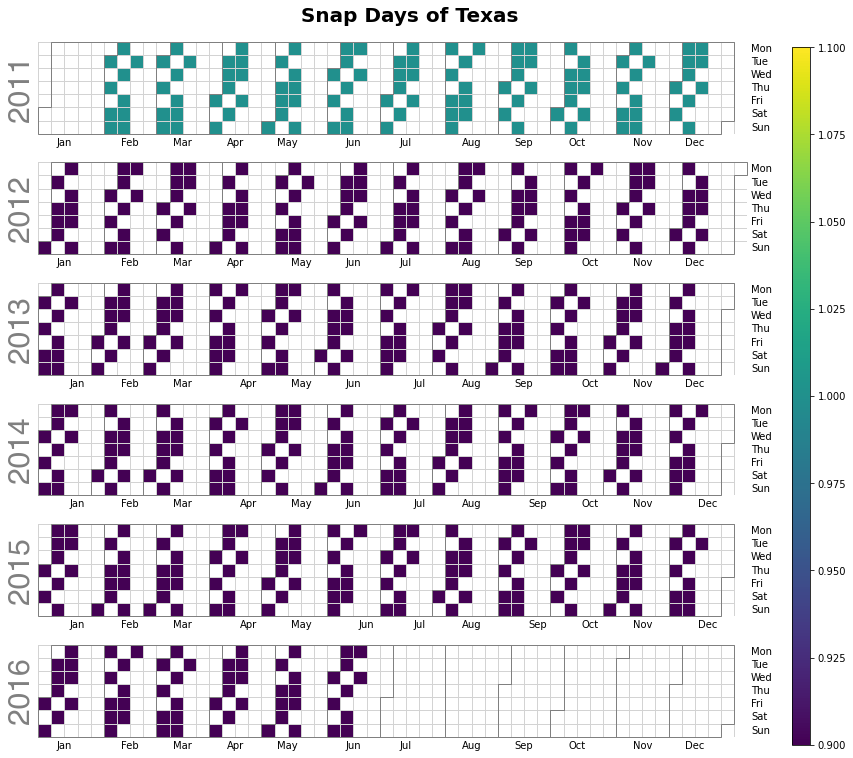

In [24]:
snap_TX=snap_df['snap_TX']; snap_TX.index=pd.to_datetime(snap_df['date'])
calplot.calplot(snap_TX, linecolor='lightgray', fillcolor='white', suptitle='Snap Days of Texas',
               suptitle_kws={'fontsize':20, 'fontweight':'bold'});

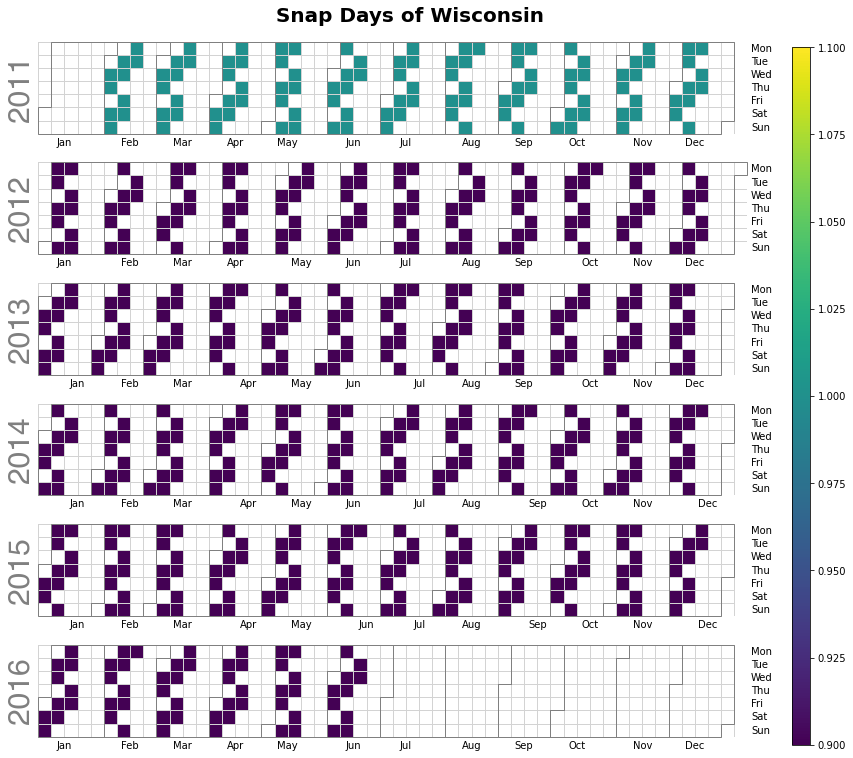

In [25]:
snap_WI=snap_df['snap_WI']; snap_WI.index=pd.to_datetime(snap_df['date'])
calplot.calplot(snap_WI, linecolor='lightgray', fillcolor='white', suptitle='Snap Days of Wisconsin',
               suptitle_kws={'fontsize':20, 'fontweight':'bold'});

We can see that there are no fixed dates for SNAP every month, SNAP days occur on different dates every month. I also noticed that SnapDay had different dates for each week. Now let's see how many products are sold per Snap Day by category. <br>매달 Snap의 날짜는 정해진 것이 아니며, Snap Day는 매월 다른 날짜에 발생한다는 것을 알 수 있습니다. 각 주마다 Snap Day의 날짜가 동일하지 않다는 것도 확인할 수 있었습니다. 이제 Snap Day마다 각 카테고리별 상품들이 얼마나 많이 팔리는지 알아보겠습니다.

In [26]:
HOBBIES_index = [c for c in past_sales.columns if 'HOBBIES' in c]
HOUSEHOLD_index = [c for c in past_sales.columns if 'HOUSEHOLD' in c]
FOOD_index = [c for c in past_sales.columns if 'FOOD' in c]
snap_CA_date = calendar[:1913][calendar[:1913]['snap_CA']==1]['date']
nosnap_CA_date = calendar[:1913][calendar[:1913]['snap_CA']==0]['date']

In [70]:
snap_CA_HOBBIES_df = past_sales.loc[snap_CA_date, HOBBIES_index]
nosnap_CA_HOBBIES_df = past_sales.loc[nosnap_CA_date, HOBBIES_index]
snap_CA_HOBBIES_ratio = 100*snap_CA_HOBBIES_df.sum().sum()/len(snap_CA_HOBBIES_df)/(nosnap_CA_HOBBIES_df.sum().sum()/len(nosnap_CA_HOBBIES_df)+snap_CA_HOBBIES_df.sum().sum()/len(snap_CA_HOBBIES_df))
Gauge("Snap Day Hobbies Sales Ratio in California").add("", "", np.round(snap_CA_HOBBIES_ratio, 3))

In [71]:
snap_CA_HOUSEHOLD_df = past_sales.loc[snap_CA_date, HOUSEHOLD_index]
nosnap_CA_HOUSEHOLD_df = past_sales.loc[nosnap_CA_date, HOUSEHOLD_index]
snap_CA_HOUSEHOLD_ratio = 100*snap_CA_HOUSEHOLD_df.sum().sum()/len(snap_CA_HOUSEHOLD_df)/(nosnap_CA_HOUSEHOLD_df.sum().sum()/len(nosnap_CA_HOUSEHOLD_df)+snap_CA_HOUSEHOLD_df.sum().sum()/len(snap_CA_HOUSEHOLD_df))
Gauge("Snap Day Household Sales Ratio in California").add("", "", np.round(snap_CA_HOUSEHOLD_ratio, 3))

In [29]:
snap_CA_FOOD_df = past_sales.loc[snap_CA_date, FOOD_index]
nosnap_CA_FOOD_df = past_sales.loc[nosnap_CA_date, FOOD_index]
snap_CA_FOOD_ratio = 100*snap_CA_FOOD_df.sum().sum()/len(snap_CA_FOOD_df)/(nosnap_CA_FOOD_df.sum().sum()/len(nosnap_CA_FOOD_df)+snap_CA_FOOD_df.sum().sum()/len(snap_CA_FOOD_df))
Gauge("Snap Day Food Sales Ratio in California").add("", "", np.round(snap_CA_FOOD_ratio, 3))

The impact of Snap Day on sales of hobby and home categories seems minimal. But it's not without impact. I think I bought other products since I came here to buy food.<br>스냅데이가 취미 및 가정 카테고리의 판매에 미치는 영향은 음식 카테고리에 비해 적어보입니다. 하지만 영향이 없진 않습니다. 아마 음식을 사러온 김에 다른 제품들까지 사고 간 것 같습니다.

# <a id=2-3>2.3 Sales Analysis</a>
Walmat의 전반적인 판매 데이터들을 시각화하며 다양한 결과들을 도출하였습니다.

## (1) Calendar Plot<a id=2-3-1></a>
I can see that Walmart is apparently closed on Christmas. And overall sales are relatively high on weekends in comparison to normal days.<br> 우리는 월마트가 크리스마스에 문을 닫은 것을 알 수 있었습니다. 그리고 주말 전체 매출은 평일에 비해 상대적으로 높다는 것도 알 수 있었습니다.

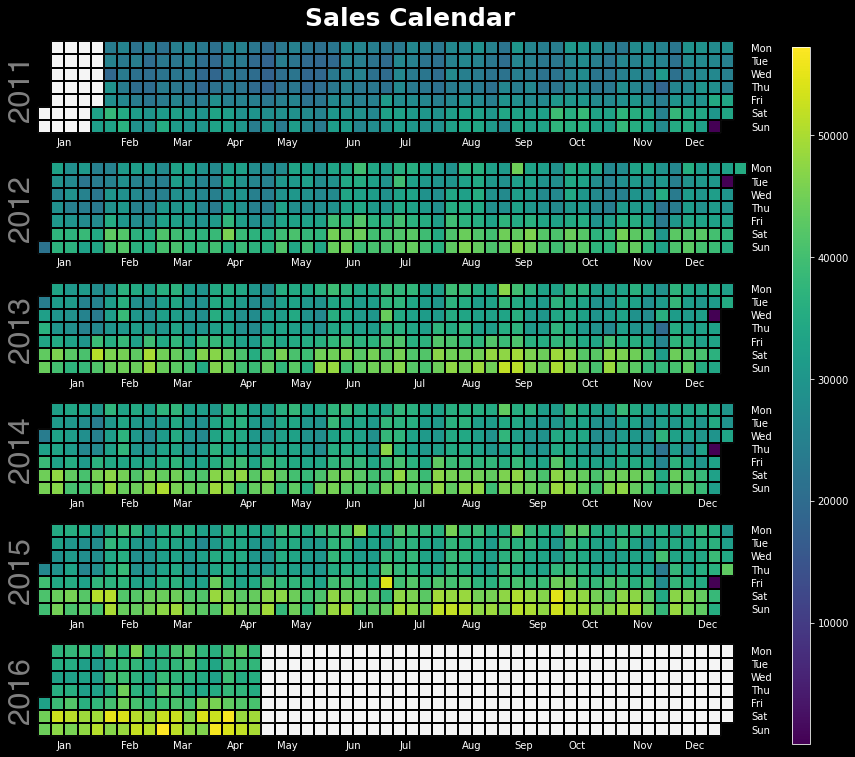

In [30]:
plt.style.use('dark_background')
all_days = pd.DatetimeIndex(calendar['date'][:1913], freq='D')
calendar_sales = pd.Series(np.array(past_sales.sum(axis=1)), index=np.array(all_days))
calplot.calplot(calendar_sales, linewidth=0.1, suptitle='Sales Calendar',
               suptitle_kws={'fontsize':25, 'fontweight':'bold'});

## (2) Category Plot<a id=2-3-2></a>
We visualized it to see how many products in each category are sold every three states. There was no noticeable difference in Texas except for a slightly higher percentage of home-related merchandise sales.<br>
세 개의 주마다 각각의 카테고리별 상품들이 얼마나 많이 팔리는지 알아보기 위해 시각화를 하였습니다. 텍사스 주에서 가정에 관련된 상품 판매 비율이 약간 높은 것 이외에는 눈에 띄는 차이가 보이지 않았습니다.

In [31]:
HOBBIES_CA_index = [c for c in past_sales.columns if 'HOBBIES' in c and 'CA' in c]
HOBBIES_TX_index = [c for c in past_sales.columns if 'HOBBIES' in c and 'TX' in c]
HOBBIES_WI_index = [c for c in past_sales.columns if 'HOBBIES' in c and 'WI' in c]
HOUSEHOLD_CA_index = [c for c in past_sales.columns if 'HOUSEHOLD' in c and 'CA' in c]
HOUSEHOLD_TX_index = [c for c in past_sales.columns if 'HOUSEHOLD' in c and 'TX' in c]
HOUSEHOLD_WI_index = [c for c in past_sales.columns if 'HOUSEHOLD' in c and 'WI' in c]
FOOD_CA_index = [c for c in past_sales.columns if 'FOOD' in c and 'CA' in c]
FOOD_TX_index = [c for c in past_sales.columns if 'FOOD' in c and 'TX' in c]
FOOD_WI_index = [c for c in past_sales.columns if 'FOOD' in c and 'WI' in c]

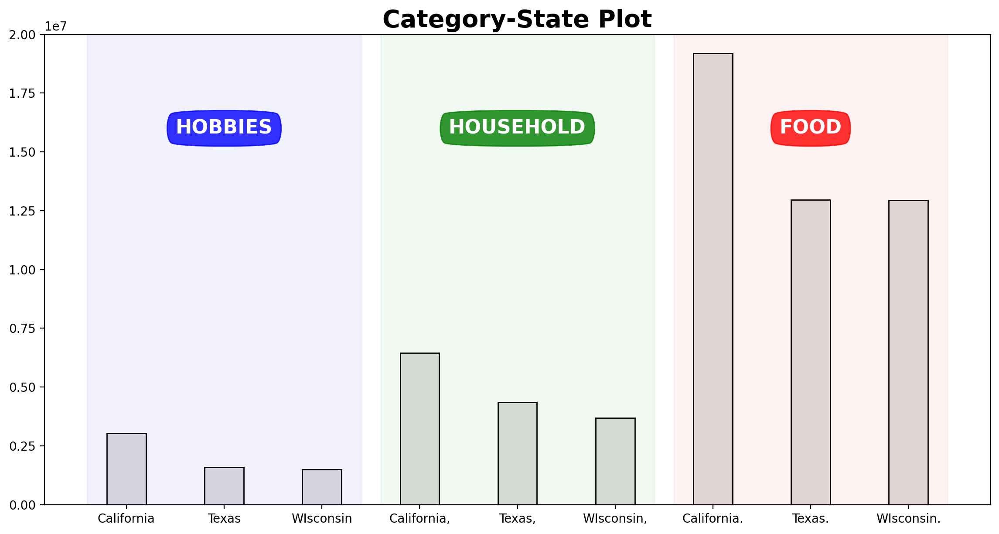

In [32]:
plt.style.use('default')
cat_state_dict = {'California': past_sales[HOBBIES_CA_index].sum().sum(), 
                  'Texas': past_sales[HOBBIES_TX_index].sum().sum(),
                  'WIsconsin': past_sales[HOBBIES_WI_index].sum().sum(), 
                  'California,': past_sales[HOUSEHOLD_CA_index].sum().sum(),
                  'Texas,': past_sales[HOUSEHOLD_TX_index].sum().sum(), 
                  'WIsconsin,': past_sales[HOUSEHOLD_WI_index].sum().sum(),
                  'California.': past_sales[FOOD_CA_index].sum().sum(), 
                  'Texas.': past_sales[FOOD_TX_index].sum().sum(),
                  'WIsconsin.': past_sales[FOOD_WI_index].sum().sum()}
cat_state_df = pd.DataFrame(cat_state_dict.items(), columns=['cat_state', 'total_sales'])

fig, ax = plt.subplots(1,1, figsize=(14, 7), dpi=200)
ax.set_ylim(0, 20000000)
ax.bar(cat_state_df['cat_state'], cat_state_df['total_sales'],  color="#e0e0e0", width=0.4, edgecolor='black')

color =  ['blue',  'green',  'red']
span_range = [[0, 2], [3, 5], [6, 8]]

for idx, sub_title in enumerate(['HOBBIES', 'HOUSEHOLD', 'FOOD']):
    ax.annotate(sub_title,
                xy=(sum(span_range[idx])/2 ,20000000*0.8),
                xytext=(0,0), textcoords='offset points',
                va="center", ha="center",
                color="w", fontsize=16, fontweight='bold',
                bbox=dict(boxstyle='round4', pad=0.5, color=color[idx], alpha=0.8))
    ax.axvspan(span_range[idx][0]-0.4,span_range[idx][1]+0.4,  color=color[idx], alpha=0.05)
ax.set_title('Category-State Plot', fontsize=20, fontweight='bold', position=(0.50, 0))
plt.show()

## (3) Sales Plot<a id=2-3-3></a>
I compared the rolling sales for each store in our dataset. California's 3rd store seems to have the highest mean sales. Wisconsin's first store grew significantly faster from d_500 to d_600 and second store as well from d_600 to d_700. I guess there was big promotion events sequentially in Wisconsin.<br>
데이터 세트의 각 스토어에 대한 판매 분포를 시각화하였습니다. 평균 매출이 가장 높은 곳은 캘리포니아의 3호점인 것 같습니다. 위스콘신 주의 1호점은 d_500에서 d_600으로, 2호점은 d_600에서 d_700으로 크게 성장했습니다. 위스콘신에서 순차적으로 큰 행사가 있었던 것 같습니다 (혹은 매장 확장 공사를 진행하였을 수도 있습니다).

In [33]:
store_list = sell_prices['store_id'].unique()
means = []
fig = go.Figure()
for store in store_list:
    store_items = [c for c in past_sales.columns if store in c]
    data = past_sales[store_items].sum(axis=1).rolling(120).mean()
    means.append(np.mean(past_sales[store_items].sum(axis=1)))
    fig.add_trace(go.Scatter(x=np.arange(len(data)), y=data, name=store))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales Per Store", 
                  title_font_size=30, title_font_family='Times New Roman', template='plotly_dark')

I compared the sales distribution for each store in the dataset. CA_1 and CA_4 data are left-skewed. CA_2, WI_3 data are right-skewed. Except the first store of Wisconsin, every store's sales data are not concentrated.<br>
데이터 세트의 각 스토어에 대한 판매 분포를 box plot으로 비교했습니다. CA_1 및 CA_4 데이터는 left-skewed되었고, CA_2, WI_3 데이터는 right-skewed되어있습니다. 위스콘신 1호점을 제외하면 모든 매장의 판매 데이터가 몰려있지 않았습니다.

In [34]:
fig = go.Figure()

for idx, store in enumerate(store_list):
        store_items = [c for c in past_sales.columns if store in c]
        data = past_sales[store_items].sum(axis=1).rolling(90).mean()
        fig.add_trace(go.Box(x=[store]*len(data), y=data, name=store))
    
fig.update_layout(yaxis_title="Sales", xaxis_title="Time", title="Rolling Average Sales vs. Time (per store)", 
                  title_font_size=30, title_font_family='Times New Roman', template='plotly_dark')

# <a id=2-4>2.4 Sample Sales Data</a>

I'll pick random products and see how much people buy them through visualization.<br> There are a total of 30490 products, so I'll select a total of 30 products for each 1000th time and visualize them.<br>
우리는 임의로 판매 상품들을 고를 것이고 사람들이 얼마나 그것들을 사는지 시각화를 통해 알아볼 것입니다.<br>
총 30490개가 있으므로 1000번째씩 총 30개의 상품들을 골라서 시각화해보겠습니다.

In [35]:
ids = sorted(list(set(sales_train_validation['id'])))

fig = make_subplots(rows=10, cols=3,
                    subplot_titles=tuple([str(i)+'th sample sales data' for i in np.arange(1000, 30001, 1000)]))

for i in range(10):
    for j in range(3):
        fig.add_trace(go.Scatter(x=np.arange(1913), y=sales_train_validation.loc[sales_train_validation['id'] == ids[(i+1)*1000+j*8000-1]].set_index('id')[d_cols].values[0], 
                                 showlegend=False, mode = 'lines', name='{} Sample'.format(i)),
                     row=i+1, col=j+1)

fig.update_layout(height=1500, width=1000, title='Sample Sales Data', 
                  title_font_size=30, title_font_family='Times New Roman', template='plotly_dark')
fig.show()

Above plots are very fluctuating, due to the fact that plenty of factors affect the sales on a given day. Even some range of days, the sales quantity is zero. I guess there's out of stock or may not be available due to some reasons.<br>위 그래프는 다양한 원인에 의하여 변동이 심하고 불규칙적입니다. 심지어 어느 구간에서는 하나도 팔리지 않았습니다. 이로 미루어 볼 때, 재고가 소진되었거나 어떤 이유로 사지 못하는 상황이 발생하였을 것이라고 추측할 수 있었습니다.

Since the y-axis was not scaled due to different y-axis, we unified the y-axis to make it easy to compare each sample at a glance.<br>y축이 서로 달라 스케일링이 되지 않았으므로 각 샘플들을 한눈에 비교하기 쉽게 y축을 통일하여 시각화를 진행해보았습니다.

In [36]:
fig = make_subplots(rows=10, cols=3, shared_yaxes='all',
                    subplot_titles=tuple([str(i)+'th sample sales data' for i in np.arange(1000, 30001, 1000)]))

for i in range(10):
    for j in range(3):
        fig.add_trace(go.Scatter(x=np.arange(1913), y=sales_train_validation.loc[sales_train_validation['id'] == ids[(i+1)*1000+j*8000-1]].set_index('id')[d_cols].values[0], 
                                 showlegend=False, mode = 'lines', name='{} Sample'.format(i)),
                     row=i+1, col=j+1)

fig.update_layout(height=1500, width=1000, title='Sample Sales Data (Shared Y-axis)', 
                  title_font_size=30, title_font_family='Times New Roman', template='plotly_dark')
fig.show()

# <a id='3'><font size=6>3. Simple Modeling</font></a>

> Now, I will demonstrate how sales can be forecasted using **Time Series Forecasting Analysis**<br>
이제 시계열 예측 분석을 사용하여 매출을 예측하는 방법을 시연하겠습니다.

# <a id=3-1>3.1 Train/Val Split</a>

Make simple training and validation sets to train and validate our models.<br>
모델을 트레이닝하고 검증하기 위한 간단한 교육 및 검증 세트를 만들었습니다.
- train_dataset: 84개
- val_dataset: 28개

In [37]:
train_dataset = sales_train_validation[d_cols[-112:-28]].replace(0, 0.1)
val_dataset = sales_train_validation[d_cols[-28:]]

I'll select 5000th, 15000th, 25000th samples from sorted items.<br>
5000번째, 15000번째, 25000번째 상품들을 골라서 보겠습니다.

In [38]:
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[5000].values,
                        marker=dict(color='dodgerblue'), showlegend=False),
             row=1, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), mode='lines', y=val_dataset.loc[5000].values,
                        marker=dict(color='darkorange'), showlegend=False),
             row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[10000].values,
                        marker=dict(color='dodgerblue'), showlegend=False),
             row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), mode='lines', y=val_dataset.loc[10000].values,
                        marker=dict(color='darkorange'), showlegend=False),
             row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[15000].values,
                        marker=dict(color='dodgerblue'), showlegend=False),
             row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), mode='lines', y=train_dataset.loc[15000].values,
                        marker=dict(color='darkorange'), showlegend=False),
             row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[20000].values,
                        marker=dict(color='dodgerblue'), showlegend=False),
             row=4, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), mode='lines', y=train_dataset.loc[20000].values,
                        marker=dict(color='darkorange'), showlegend=False),
             row=4, col=1)

fig.update_layout(height=1200, width=900,
                  title_text='Train(84) vs Validation(24) Sales', template='plotly_dark')
fig.show()

# <a id=3-2> 3.2 Simple Moving average</a>

It calculates the mean sales over the previous 100 days and forecasts that as the next day's sales. This method takes the previous 100 timesteps into consideration. The model can be summarized as follows:<br>
이것은 지난 100일 동안의 평균 매출을 계산하고 이를 다음 날의 매출로 예측합니다. 모델은 아래와 같은 수식으로 나타낼 수 있습니다. 아래 식은 가장 기본적인 이동평균 모형을 나타낸 식입니다.

$$\hat{y}_{t+1}=\frac{1}{30} \cdot \sum_{t-30}^{t} y_{n}$$

This model is unable to find high-level trends in the sales, so it would generate high loss.<br>
이 모델은 높은 수준의 추세를 찾을 수 없기 때문에 아마 높은 loss값이 나올 것입니다.

In [39]:
period = 30
prediction_sma = train_dataset.iloc[:, -period:].copy() 
for i in range(len(val_dataset.loc[0])): 
    prediction_sma['F'+str(i+1)] = prediction_sma.iloc[:, -period:].mean(axis=1) 
prediction_sma = prediction_sma[['F'+str(i+1) for i in range(len(val_dataset.loc[0]))]] 
error_sma = mean_squared_error(prediction_sma, val_dataset)**0.5
score_sma = r2_score(prediction_sma, val_dataset)*100

In [40]:
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[5000].values, 
                         marker=dict(color="skyblue"), name="Train"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[5000].values, mode='lines', 
                         marker=dict(color="green"), name="Val"),
    row=1, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_sma.loc[5000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[10000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[10000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_sma.loc[10000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[15000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[15000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_sma.loc[15000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[20000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=4, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[20000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=4, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_sma.loc[20000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=4, col=1)

fig.update_layout(height=1200, width=900, title_text="Moving Average", template='plotly_dark')
fig.show()

# <a id=3-3> 3.3 Simple Exponential Smoothing</a>

it may be sensible to attach larger weights to more recent observations than to observations from the distant past. The technique which works on this principle is called Simple exponential smoothing. Forecasts are calculated using weighted averages.<br>
먼 과거의 관측치보다 최근 관측치에 더 큰 가중치를 추가하는 것이 합리적일 수 있습니다. 이것을 **단순 지수 평활**이라고 합니다. 예측은 가중 평균을 사용하여 계산됩니다.

$$
\begin{array}{c}
\hat{y}_{t+1}=\alpha \cdot y_{t}+\alpha \cdot(1-\alpha) \cdot y_{t-1}+\alpha \cdot(1-\alpha)^{2} \cdot y_{t-2}+\ldots \\
\hat{y}_{t+1}=\alpha \cdot y_{t}+(1-\alpha) \cdot \hat{y}_{t}
\end{array}
$$

In [41]:
prediction_ses = []
for row in tqdm(train_dataset.values):
    fit2 = SimpleExpSmoothing(row, initialization_method='estimated').fit(smoothing_level=0.4, optimized=True)
    prediction_ses.append(fit2.forecast(28))
error_ses = mean_squared_error(prediction_ses, val_dataset)**0.5
score_ses = r2_score(prediction_ses, val_dataset)*100

  0%|          | 0/30490 [00:00<?, ?it/s]

In [42]:
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[5000].values, 
                         marker=dict(color="skyblue"), name="Train"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[5000].values, mode='lines', 
                         marker=dict(color="green"), name="Val"),
    row=1, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_ses[5000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[10000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[10000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_ses[10000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[15000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[15000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_ses[15000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[20000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=4, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[20000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=4, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_ses[20000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=4, col=1)

fig.update_layout(height=1200, width=900, title_text="Single Exponential Smoothing", template='plotly_dark')
fig.show()

# <a id=3-4> 3.4 Double Exponential Smoothing (Holts Double Exponential Smoothing)</a>

Single Smoothing does not excel in following the data when there is a trend. This situation can be improved by the introduction of a second equation with a second constant, γ, which must be chosen in conjunction with α.<br>
단일 평활은 추세가 있는 경우 데이터를 추적하는 데 탁월하지 않습니다. 이 상황은 α와 함께 선택되어야 하는 두 번째 상수인 β와 함께 두 번째 방정식을 도입함으로써 개선될 수 있습니다.

$$
\hat{y}_{t+h}=l_{t}+h \cdot b_{t}
$$

Double Exponential Smoothing technique is used for forecasting with trending data. It has level and trend.<br>
이중 지수 평활 기술은 추세 데이터를 예측하기 위해 사용됩니다. 아래와 같은 수준 성분과 과 추세 성분을 가지고 있습니다.

$$
\begin{array}{l}
Level Equation : l_{t}=a \cdot y_{t}+(1-\alpha) \cdot\left(l_{t-1}+b_{t-1}\right) \\
Trand Equation : b_{t}=\beta \cdot\left(l_{t}-l_{t-1}\right)+(1-\beta) \cdot b_{t-1}
\end{array}
$$

In [43]:
prediction_des = []
for row in tqdm(train_dataset.values):
    fit = ExponentialSmoothing(row, seasonal_periods=12, 
                               initialization_method='estimated').fit(smoothing_level = 0.2, smoothing_trend = 0.15)
    prediction_des.append(fit.forecast(28))
error_des = mean_squared_error(prediction_des, val_dataset)**0.5
score_des = r2_score(prediction_des, val_dataset)*100

  0%|          | 0/30490 [00:00<?, ?it/s]

In [44]:
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[5000].values, 
                         marker=dict(color="skyblue"), name="Train"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[5000].values, mode='lines', 
                         marker=dict(color="green"), name="Val"),
    row=1, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_des[5000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[10000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[10000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_des[10000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[15000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[15000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_des[15000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[20000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=4, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[20000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=4, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_des[20000], mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=4, col=1)

fig.update_layout(height=1200, width=900, title_text="Single Exponential Smoothing", template='plotly_dark')
fig.show()

# <a id=3-5>3.5 Prophet</a>

The main components of the Prophet model are Trend, Seasonality, and Holiday. When combined, the three can be represented by the formula below.<br>
Prophet 모델의 주요 구성요소는 Trend, Seasonality, Holiday 입니다. 이 세가지를 결합하면 아래의 공식으로 나타낼 수 있습니다.

$$
y(t)=g(t)+s(t)+h(t)+\epsilon_{i}
$$
- **Trend**<br>$g(t):$ piecewise linear or logistic growth curve for modelling non-periodic changes in time series<br>&emsp;&emsp;&emsp;주기적이지 않은 변화인 트렌드를 나타냅니다
- **Seasonality**<br>$\boldsymbol{s}(\boldsymbol{t})$ : periodic changes (e.g. weekly/yearly seasonality)<br>&emsp;&emsp;&emsp;weekly, yearly 등 주기적으로 나타나는 패턴들을 포함합니다.
- **Holiday**<br>$h(t):$ effects of holidays (user provided) with irregular schedules<br>&emsp;&emsp;&emsp;휴일과 같이 불규칙한 이벤트들을 나타냅니다. 
- **Error**<br>$\epsilon_{i}:$ error term accounts for any unusual changes not accommodated by the model<br>&emsp;&emsp;정규분포라고 가정한 오차입니다.

In [45]:
prophet_df = train_dataset.T
prophet_df.index = pd.date_range(start='20160104', periods=84)
prediction_pro = []
for i in tqdm(range(3000)):
    df = prophet_df[i].reset_index()
    df.columns = ['ds', 'y']
    m = Prophet(growth='linear', uncertainty_samples=False, 
                  yearly_seasonality=False, daily_seasonality=True).fit(df)
    future = m.make_future_dataframe(periods=28)
    prediction_pro.append(m.predict(future).iloc[-28:, -1])
error_pro = mean_squared_error(np.array(prediction_pro), val_dataset.iloc[:3000])**0.5
score_pro = r2_score(np.array(prediction_pro), val_dataset.iloc[:3000])*100

  0%|          | 0/3000 [00:00<?, ?it/s]

In [46]:
prediction_pro5000 = []
df = prophet_df[5000].reset_index()
df.columns = ['ds', 'y']
fit = Prophet(growth='linear', yearly_seasonality=False, daily_seasonality=True).fit(df)
future = fit.make_future_dataframe(periods=28)
prediction_pro5000 = fit.predict(future).iloc[-28:, -1]

prediction_pro10000 = []
df = prophet_df[10000].reset_index()
df.columns = ['ds', 'y']
fit = Prophet(growth='linear', yearly_seasonality=False, daily_seasonality=True).fit(df)
future = fit.make_future_dataframe(periods=28)
prediction_pro10000 = fit.predict(future).iloc[-28:, -1]

prediction_pro15000 = []
df = prophet_df[15000].reset_index()
df.columns = ['ds', 'y']
fit = Prophet(growth='linear', yearly_seasonality=False, daily_seasonality=True).fit(df)
future = fit.make_future_dataframe(periods=28)
prediction_pro15000 = fit.predict(future).iloc[-28:, -1]

prediction_pro20000 = []
df = prophet_df[20000].reset_index()
df.columns = ['ds', 'y']
fit = Prophet(growth='linear', yearly_seasonality=False, daily_seasonality=True).fit(df)
future = fit.make_future_dataframe(periods=28)
prediction_pro20000 = fit.predict(future).iloc[-28:, -1]

In [47]:
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[5000].values, 
                         marker=dict(color="skyblue"), name="Train"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[5000].values, mode='lines', 
                         marker=dict(color="green"), name="Val"),
    row=1, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_pro5000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[10000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[10000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_pro10000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[15000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[15000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_pro15000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[20000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=4, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[20000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=4, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_pro20000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=4, col=1)

fig.update_layout(height=1200, width=900, title_text="Prophet", template='plotly_dark')
fig.show()

# <a id=3-6>3.6 ARIMA</a>

AutoRegressive Integrated Moving Average (ARIMA) is a combination of an autoregressive model (AR) and a moving averagemodel (MA) and a difference (I) to ensure the normality of data. For ARIMA (1,1,0), this means that AR(1) and I(1) are combined models.<br>ARIMA(AutoRegressive Integrated Moving Average)는 자기 회귀 모델(AR)과 이동 평균 모델(MA)과 데이터의 정상성을 확보하기 위한 차분(I)을 합친 모델이다. AR의 차수는 p, I의 차수는 d, MA의 차수는 q로 표시한다. (ARIMA(1,1,0) 일 경우 AR(1)와 I(1)를 합친 모델이라는 의미이다)

In [48]:
prediction_arima = []
warnings.filterwarnings(action='ignore')
for row in tqdm(train_dataset.values):
    arima = sm.tsa.statespace.SARIMAX(row, order=(0,1,0), seasonal_order=(0,1,0,7)).fit()
    prediction_arima.append(arima.predict(0, 27, typ='levels'))
prediction_arima = np.where(np.array(prediction_arima)<0, 0, prediction_arima)
error_arima = mean_squared_error(prediction_arima, val_dataset)**0.5
score_arima = r2_score(prediction_arima, val_dataset)*100

  0%|          | 0/30490 [00:00<?, ?it/s]

In [49]:
prediction_arima5000 = []
arima = sm.tsa.statespace.SARIMAX(train_dataset.values[5000], order=(0,1,0), seasonal_order=(0,1,0,7)).fit()
prediction_arima5000 = arima.predict(0, 27)
prediction_arima5000 = np.where(prediction_arima5000<0, 0, prediction_arima5000)

prediction_arima10000 = []
arima = sm.tsa.statespace.SARIMAX(train_dataset.values[10000], order=(0,1,0), seasonal_order=(0,1,0,7)).fit()
prediction_arima10000 = arima.predict(0, 27)
prediction_arima10000 = np.where(prediction_arima10000<0, 0, prediction_arima10000)

prediction_arima15000 = []
arima = sm.tsa.statespace.SARIMAX(train_dataset.values[15000], order=(0,1,0), seasonal_order=(0,1,0,7)).fit()
prediction_arima15000 = arima.predict(0, 27)
prediction_arima15000 = np.where(prediction_arima15000<0, 0, prediction_arima15000)

prediction_arima20000 = []
arima = sm.tsa.statespace.SARIMAX(train_dataset.values[20000], order=(0,1,0), seasonal_order=(0,1,0,7)).fit()
prediction_arima20000 = arima.predict(0, 27)
prediction_arima20000 = np.where(prediction_arima20000<0, 0, prediction_arima20000)

In [50]:
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[5000].values, 
                         marker=dict(color="skyblue"), name="Train"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[5000].values, mode='lines', 
                         marker=dict(color="green"), name="Val"),
    row=1, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_arima5000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred"),
    row=1, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[10000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[10000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=2, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_arima10000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=2, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[15000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[15000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=3, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_arima15000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=3, col=1)

fig.add_trace(go.Scatter(x=np.arange(84), mode='lines', y=train_dataset.loc[20000].values, 
                         marker=dict(color="skyblue"), name="Train", showlegend=False),
    row=4, col=1)

fig.add_trace(go.Scatter(x=np.arange(84, 106), y=val_dataset.loc[20000].values, mode='lines', 
                         marker=dict(color="green"), name="Val", showlegend=False),
    row=4, col=1)
fig.add_trace(go.Scatter(x=np.arange(84, 106), y=prediction_arima20000, mode='lines', 
                         marker=dict(color="cyan"), name="Pred", showlegend=False),
    row=4, col=1)

fig.update_layout(height=1200, width=900, title_text="ARIMA", template='plotly_dark')
fig.show()

# <a id=3-7>3.7 Model Evaluation</a>

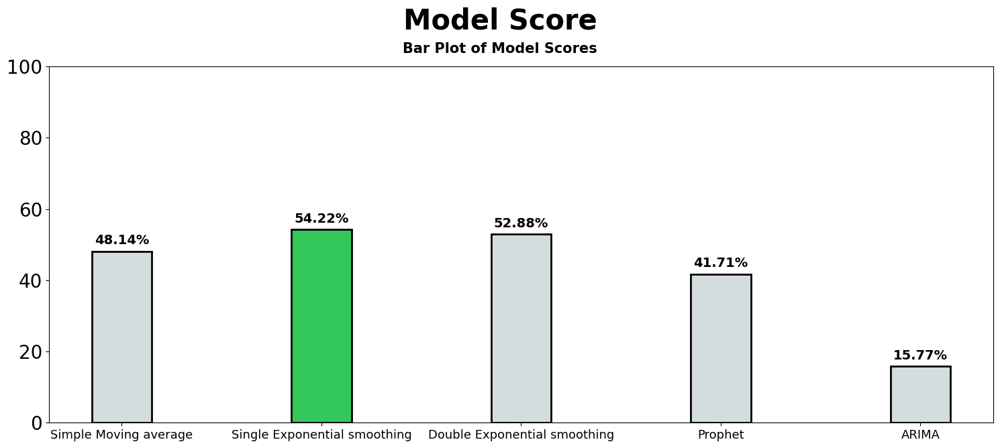

In [51]:
model = ["Simple Moving average",  "Single Exponential smoothing", 
         "Double Exponential smoothing", "Prophet", "ARIMA"]
score = [score_sma, score_ses, score_des, score_pro, score_arima]
color_map = ['#d4dddd' for _ in range(len(model))]
color_map[np.argmax(score)] = light_palette[2]

fig, ax = plt.subplots(1, 1, figsize=(15, 6))

bars = ax.bar(model, score, 
       color=color_map, width=0.3, 
       edgecolor='black', 
       linewidth=2)

for i in range(len(model)):
    ax.annotate(f"{score[i]:.02f}%", xy=(i, score[i]+3), va = 'center', ha='center', fontsize=14, fontweight='bold') 
ax.set_ylim(0, 100)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=20)
fig.text(0.5, 1.05, 'Model Score', fontsize=30, fontweight='bold', ha='center')
fig.text(0.5, 0.99, 'Bar Plot of Model Scores', fontsize=15, fontweight='bold', ha='center')

fig.tight_layout()
plt.show()

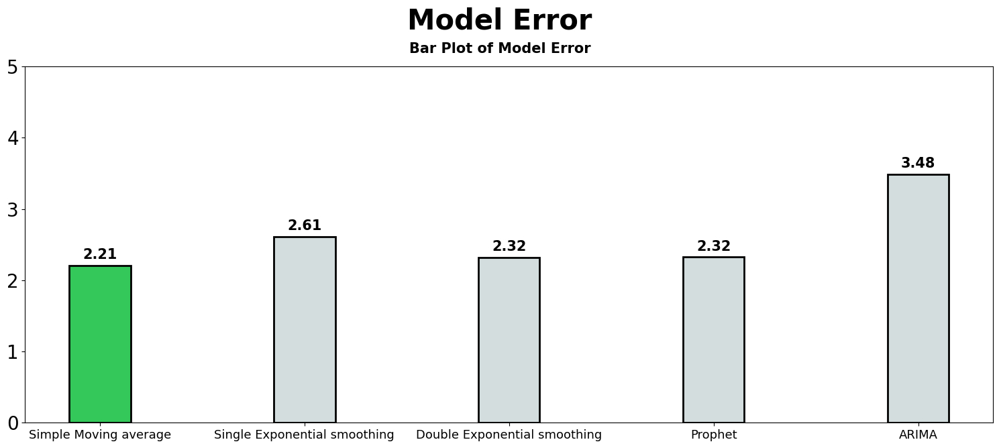

In [65]:
model = ["Simple Moving average",  "Single Exponential smoothing", 
         "Double Exponential smoothing", "Prophet", "ARIMA"]
error = [error_sma, error_ses, error_des, error_pro, error_arima]
color_map = ['#d4dddd' for _ in range(len(model))]
color_map[np.argmin(error)] = light_palette[2]

fig, ax = plt.subplots(1, 1, figsize=(15, 6))

bars = ax.bar(model, error, 
       color=color_map, width=0.3, 
       edgecolor='black', 
       linewidth=2)

for i in range(len(model)):
    ax.annotate(f"{error[i]:.02f}", xy=(i, error[i]+0.15), va = 'center', ha='center', fontsize=15, fontweight='bold') 
ax.set_ylim(0, 5)
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=20)
fig.text(0.5, 1.05, 'Model Error', fontsize=30, fontweight='bold', ha='center')
fig.text(0.5, 0.99, 'Bar Plot of Model Error', fontsize=15, fontweight='bold', ha='center')

fig.tight_layout()
plt.show()

# <a id='4'><font size=6>4. Plan</font></a>

- Feature Engineering을 통한 새로운 input을 만들기
- 트리 기반 (XGBoost, Lightgbm) 모델 학습을 통한 결과 예측 후 비교
- RNN, LSTM 등 시계열 예측에 용이한 인공 신경망 모델을 학습하고 결과를 예측하여 비교
- 모델들 중 성능이 좋은 것들을 이용하여 CV 기반 스태킹 앙상블 이용

## <center>🙋신민경 - 데이터 분석, 기획<br>🙋🏻‍♂️신선웅 - 시각화, 모델링</center>

<center><a href="#top" class="btn btn-success btn-lg active" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="go to Colors">Move to TOP</a><center>